In [1]:
import os
import sys
import re
import numpy as np
import pandas as pd
import cv2
import glob
import json
import matplotlib.pyplot as plt

from collections import deque
from predictors.posepredictor import PosePredictor
# split off train and test (single time point models)
from sklearn.model_selection import train_test_split
seed = 1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix

In [2]:
def check_or_create_dir(base_path, relative_path: str):
    dir_path = os.path.join(base_path, relative_path)
    if os.path.isdir(dir_path):
        print("The directory %s already exists" % dir_path)
    else:
        try:
            os.mkdir(dir_path)
        except  OSError:
            print("Creation of the directory %s failed" % dir_path)
        else:
            print("Successfully created the directory %s " % dir_path)

In [3]:
with open("image_data_table.json") as image_talbe_file:
    image_data_table = json.load(image_talbe_file)

In [4]:
downsample_factor = 3
n_frames = 32
train_test_split = 0.7

In [5]:
X_train, y_train, X_test, y_test = [], [], [], []
for dataset in image_data_table["datasets"]:
    for user in dataset["users"]:
        for date in dataset["dates"]:
            for action in dataset["actions"]:
                files_path = os.path.join(
                    dataset["location"],
                    dataset["version_num"],
                    "pose",
                    user,
                    date,
                    action
                )
                times = glob.glob(os.path.join(files_path,"*"))
                for time in times:
                    time_stamp = os.path.split(time)[-1]
                    files = glob.glob(os.path.join(time,'*.csv'))
                    # create the pose deques
                    train_deque_list = []
                    for i in range(downsample_factor):
                        train_deque_list.append(deque(maxlen=n_frames))

                    # print(files)
                    for j in range(0, int(train_test_split * len(files))):
                        # load and predict on image
                        #print(file)
                        current_pose = np.genfromtxt(files[j], delimiter=",")
                        # deque index
                        index = int(j % downsample_factor)
                        # add to pose deque
                        train_deque_list[index].append(current_pose)
                        # if the deque is full then add it to the X and y
                        #print(deque_list[index])
                        if len(train_deque_list[index]) == n_frames:
                            # add file to the data lists for exploration
                            X_train.append(np.array(train_deque_list[index]))
                            y_train.append(action)
                    
                    # create the pose deques
                    test_deque_list = []
                    for i in range(downsample_factor):
                        test_deque_list.append(deque(maxlen=n_frames))

                    # print(files)
                    for j in range(int(train_test_split * len(files)), len(files)):
                        # load and predict on image
                        #print(file)
                        current_pose = np.genfromtxt(files[j], delimiter=",")
                        # deque index
                        index = int(j % downsample_factor)
                        # add to pose deque
                        test_deque_list[index].append(current_pose)
                        # if the deque is full then add it to the X and y
                        #print(deque_list[index])
                        if len(test_deque_list[index]) == n_frames:
                            # add file to the data lists for exploration
                            X_test.append(np.array(test_deque_list[index]))
                            y_test.append(action)

In [6]:
X_train = np.array(X_train)
print("X_train shape", X_train.shape)
y_train = np.array(y_train)
print("y_train shape", y_train.shape)
X_test = np.array(X_test)
print("X_test shape", X_test.shape)
y_test = np.array(y_test)
print("y_test shape", y_test.shape)

print(
    "train X ((min, min), (max, max)): ((",
    X_train[:,:,:,0].min(),", ", X_train[:,:,:,1].min(), "), (",
    X_train[:,:,:,0].max(),", ", X_train[:,:,:,1].max(), "))"
)

X_train shape (1635, 32, 17, 2)
y_train shape (1635,)
X_test shape (435, 32, 17, 2)
y_test shape (435,)
train X ((min, min), (max, max)): (( 0.6663004062518999 ,  54.58317738098857 ), ( 505.493158125228 ,  642.0337267330185 ))


In [7]:
y_df = pd.DataFrame(y_train)
y_df[0].value_counts()

ROTS          327
punching      327
star_jumps    327
squats        327
rest          327
Name: 0, dtype: int64

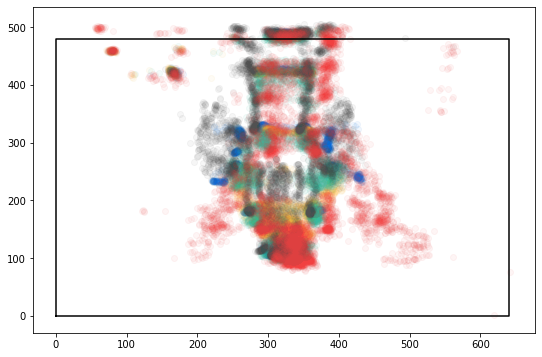

In [8]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train
for i in range(0, len(data), int(len(data)/50)):
    action = y_train[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
# ax.set_xlim((0, 640))
# ax.set_ylim((-1.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([0,0,640,640,0],[0, 480, 480, 0, 0], c='k');

In [9]:
# rescale and flip upright
image_size = np.array([480, 640])
X_train_scaled = ((X_train - (image_size / 2)) / (image_size.max() / 2))
X_test_scaled = ((X_test - (image_size / 2)) / (image_size.max() / 2))

#flip vertically
X_train_flipped = np.array(X_train_scaled)
X_train_flipped[:,:,:,0] = - X_train_flipped[:,:,:,0]

X_test_flipped = np.array(X_test_scaled)
X_test_flipped[:,:,:,0] = - X_test_flipped[:,:,:,0]


print(
    "train X ((min, min), (max, max)): ((",
    X_train_flipped[:,:,:,0].min(),", ", X_train_flipped[:,:,:,1].min(), "), (",
    X_train_flipped[:,:,:,0].max(),", ", X_train_flipped[:,:,:,1].max(), "))"
)

train X ((min, min), (max, max)): (( -0.8296661191413375 ,  -0.8294275706844108 ), ( 0.7479178112304627 ,  1.0063553960406828 ))


In [12]:
def preprocess_ndarray(user_array: np.ndarray, image_size=np.array([480, 640])):
    user_array_scaled = ((user_array - (image_size / 2)) / (image_size.max() / 2))
    user_array_flipped = np.array(user_array_scaled)
    user_array_flipped[:,:,:,0] = - user_array_flipped[:,:,:,0]

    def clip_dataset(data: np.ndarray, im_size=(480, 640)) -> np.ndarray:
        low_inds_y = data[:,:,:,0] < - im_size[0] / (im_size[1])
        low_inds_x = data[:,:,:,1] < -1
        high_inds_y = data[:,:,:,0] > im_size[0] / (im_size[1])
        high_inds_x = data[:,:,:,1] > 1
        data[low_inds_y, 0] = - im_size[0] / (im_size[1])
        data[low_inds_x, 1] = -1
        data[high_inds_y, 0] = im_size[0] / (im_size[1])
        data[high_inds_x, 1] = 1
        return data

    user_array_clipped = clip_dataset(user_array_flipped,(480, 640))
    return user_array_clipped.reshape(user_array_clipped.shape[0], -1)

In [13]:
def clip_dataset(data: np.ndarray, image_size=(480, 640)) -> np.ndarray:
    low_inds_y = data[:,:,:,0] < - image_size[0] / (image_size[1])
    low_inds_x = data[:,:,:,1] < -1
    high_inds_y = data[:,:,:,0] > image_size[0] / (image_size[1])
    high_inds_x = data[:,:,:,1] > 1
    data[low_inds_y, 0] = - image_size[0] / (image_size[1])
    data[low_inds_x, 1] = -1
    data[high_inds_y, 0] = image_size[0] / (image_size[1])
    data[high_inds_x, 1] = 1
    return data

In [14]:
X_train_flipped = clip_dataset(X_train_flipped)
X_test_flipped = clip_dataset(X_test_flipped)

print(
    "train X ((min, min), (max, max)): ((",
    X_train_flipped[:,:,:,0].min(),", ", X_train_flipped[:,:,:,1].min(), "), (",
    X_train_flipped[:,:,:,0].max(),", ", X_train_flipped[:,:,:,1].max(), "))"
)

train X ((min, min), (max, max)): (( -0.75 ,  -0.8294275706844108 ), ( 0.7479178112304627 ,  1.0 ))


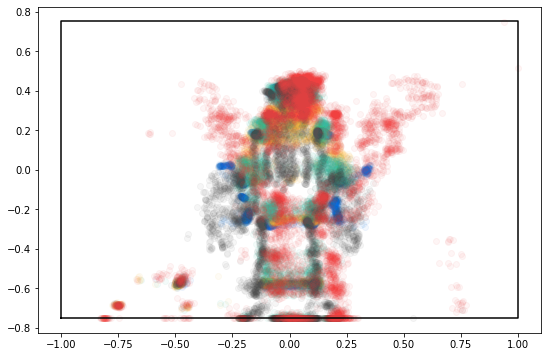

In [15]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train_flipped
for i in range(0, len(data), int(len(data)/50)):
    action = y_train[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
ax.set_xlim((-1.1,1.1))
ax.set_ylim((-1.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([-1,-1,1,1,-1],[-.75, 0.75, 0.75, -0.75, -0.75], c='k');

In [16]:
# Data augementation functions

def translate_x(data: np.ndarray, dx):
    # pose points come in (y,x) pairs
    v = np.array([0, dx])
    temp = data + v
    return temp

def translate_y(data: np.ndarray, dy):
    # pose points come in (y,x) pairs
    v = np.array([dy, 0])
    temp = data + v
    return temp

def rotate_theta(data: np.ndarray, deg):
    # theta is the angle in degrees rotated ccw
    # pose points come in (y,x) pairs
    rot = np.array(
        [[np.cos(2 * np.pi * deg / 360), np.sin(2 * np.pi * deg / 360)],
        [-np.sin(2 * np.pi * deg / 360), np.cos(2 * np.pi * deg / 360)]]
    )
    temp = rot @ np.transpose(data, (0,2,1))
    return np.transpose(temp, (0,2,1)) # TODO: implement rotate

def reflect_horizontal(data: np.ndarray, flip):
    # pose points come in (y,x) pairs
    temp = np.array(data)
    if flip >= 0.5:
        temp[:,:,1] = - temp[:,:,1]
    return temp

def reflect_vertical(data: np.ndarray, flip):
    # pose points come in (y,x) pairs
    temp = np.array(data)
    if flip >= 0.5:
        temp[:,:,0] = - temp[:,:,0]
    return temp

def scale(data: np.ndarray, mag):
    temp = mag * data
    return temp # TODO: implement scale

def test_translate_x():
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_translated = np.array(
        [[[1, 5], [3, 7]],
        [[5, 9], [7, 11]]]
        )
    test = translate_x(x, 3)
    assert(np.all(x_translated == test))

def test_translate_y():
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_translated = np.array(
        [[[5, 2], [7, 4]],
        [[9, 6], [11, 8]]]
        )
    test = translate_y(x, 4)
    assert(np.all(x_translated == test))

def test_rotate_90_degrees():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[1., 2.], [3., 4.]],
        [[5., 6.], [7., 8.]]]
        )
    x_rotated = np.array(
        [[[2., -1.], [4., -3.]],
        [[6., -5.], [8., -7.]]]
        )
    test = rotate_theta(x, 90) # 90 degrees ccw
    
    assert(np.all(x_rotated - test < 1E-6))

def test_reflect_horizontal():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[1., 2.], [3., 4.]],
        [[5., 6.], [7., 8.]]]
        )
    x_reflected = np.array(
        [[[1., -2.], [3., -4.]],
        [[5., -6.], [7., -8.]]]
        )
    test = reflect_horizontal(x, 1)
    assert(np.all(x_reflected == test))

def test_reflect_vertical():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_reflected =  np.array(
        [[[-1, 2], [-3, 4]],
        [[-5, 6], [-7, 8]]]
        )
    test = reflect_vertical(x, 1)
    assert(np.all(x_reflected == test))

def test_scale():
    x = np.array(
        [[[1., 2.], [3., 4.]],
        [[5., 6.], [7., 8.]]]
        )
    x_scaled = np.array(
        [[[2., 4.], [6., 8.]],
        [[10., 12.], [14., 16.]]]
        )
    test = scale(x, 2)
    assert(np.all(x_scaled == test))

test_translate_x()
test_translate_y()
test_rotate_90_degrees()
test_reflect_horizontal()
test_reflect_vertical()

In [31]:
epochs = 40

mu_x = 0 # mean 0, 0.4*640 pixel
sig_x = 0.4 
mu_y = 0 # mean 0, 0.05*640 pixel
sig_y = 0.2
mu_rot = 0 # mean 0, std .5 deg
sig_rot = 1
mu_scale = 1 # mean 1, std 10%
sig_scale = 0.2

X_train_augemented = []
y_train_augemented = []

# sythetic train data
data = X_train_flipped
for i in range(epochs):
    for i in range(len(data)):
        temp = data[i]
        
        low_inds_y = temp[:,:,0] <= - image_size[0] / (image_size[1])
        low_inds_x = temp[:,:,1] <= -1
        high_inds_y = temp[:,:,0] >= image_size[0] / (image_size[1])
        high_inds_x = temp[:,:,1] >= 1
        
        
        x_translation_value = np.random.normal(loc=mu_x, scale=sig_x) 
        y_translation_value = np.random.normal(loc=mu_y, scale=sig_y) 
        rotation_value = np.random.normal(loc=mu_rot, scale=sig_rot) 
        h_reflection_value = np.random.uniform(0,1)
        scale_value = np.random.normal(loc=mu_scale, scale=sig_scale) 

        temp = translate_x(temp, x_translation_value)
        temp = translate_y(temp, y_translation_value)
        temp = rotate_theta(temp, rotation_value)
        temp = reflect_horizontal(temp, h_reflection_value)
        temp = scale(temp, scale_value)

        temp[low_inds_y, 0] = - image_size[0] / (image_size[1])
        temp[low_inds_x, 1] = -1
        temp[high_inds_y, 0] = image_size[0] / (image_size[1])
        temp[high_inds_x, 1] = 1

        X_train_augemented.append(temp)
        y_train_augemented.append(y_train[i])

X_test_augemented = []
y_test_augemented = []

# sythetic train data
data = X_test_flipped
for i in range(epochs):
    for i in range(len(data)):
        temp = data[i]

        low_inds_y = temp[:,:,0] <= - image_size[0] / (image_size[1])
        low_inds_x = temp[:,:,1] <= -1
        high_inds_y = temp[:,:,0] >= image_size[0] / (image_size[1])
        high_inds_x = temp[:,:,1] >= 1

        x_translation_value = np.random.normal(loc=mu_x, scale=sig_x) # mean 0, 0.05*640 pixel
        y_translation_value = np.random.normal(loc=mu_y, scale=sig_y) # mean 0, 0.05*640 pixel
        rotation_value = np.random.normal(loc=mu_rot, scale=sig_rot) # mean 0, std .5 deg
        h_reflection_value = np.random.uniform(0,1)
        scale_value = np.random.normal(loc=mu_scale, scale=sig_scale) # mean 1, std 10%

        temp = translate_x(temp, x_translation_value)
        temp = translate_y(temp, y_translation_value)
        temp = rotate_theta(temp, rotation_value)
        temp = reflect_horizontal(temp, h_reflection_value)
        temp = scale(temp, scale_value)
        
        temp[low_inds_y, 0] = - image_size[0] / (image_size[1])
        temp[low_inds_x, 1] = -1
        temp[high_inds_y, 0] = image_size[0] / (image_size[1])
        temp[high_inds_x, 1] = 1

        X_test_augemented.append(temp)
        y_test_augemented.append(y_test[i])


In [32]:
X_train_augemented = np.array(X_train_augemented)
X_test_augemented = np.array(X_test_augemented)
print("train shape: ", X_train_augemented.shape)
print(
    "train X ((min, min), (max, max)): ((",
    X_train_augemented[:,:,:,0].min(),", ", X_train_augemented[:,:,:,1].min(), "), (",
    X_train_augemented[:,:,:,0].max(),", ", X_train_augemented[:,:,:,1].max(), "))"
)

train shape:  (65400, 32, 17, 2)
train X ((min, min), (max, max)): (( -2.184810350329134 ,  -2.85902798664749 ), ( 2.1021951808055563 ,  2.7700787799727005 ))


In [33]:
X_train_augemented = clip_dataset(X_train_augemented)
X_test_augemented = clip_dataset(X_test_augemented)
print("train shape: ", X_train_augemented.shape)
print(
    "train X ((min, min), (max, max)): ((",
    X_train_augemented[:,:,:,0].min(),", ", X_train_augemented[:,:,:,1].min(), "), (",
    X_train_augemented[:,:,:,0].max(),", ", X_train_augemented[:,:,:,1].max(), "))"
)

train shape:  (65400, 32, 17, 2)
train X ((min, min), (max, max)): (( -0.75 ,  -1.0 ), ( 0.75 ,  1.0 ))


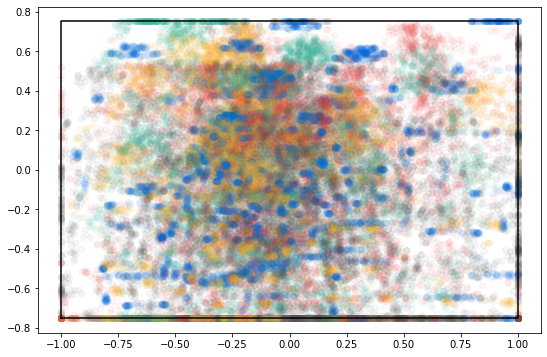

In [34]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train_augemented
for i in range(0, data.shape[0], int(data.shape[0]/100)):
    action = y_train_augemented[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
ax.set_xlim((-1.1,1.1))
ax.set_ylim((-1.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([-1,-1,1,1,-1],[-.75, 0.75, 0.75, -0.75, -0.75], c='k');

# ploting pose like a image

In [35]:
def clip_image(img) -> np.ndarray:
    inds_low = img < 0
    img[inds_low] = 0
    inds_high = img > 1
    img[inds_high] = 1
    return img

Original Train Data

((min, min), (max, max)): 
(( 0.0 ,  0.25215642739826605 ), ( 0.5838294785310322 ,  0.6252234928338909 ))
((min, min), (max, max)): 
(( 0.0 ,  0.11674627209451877 ), ( 0.5740617464952431 ,  0.6341047667343793 ))
((min, min), (max, max)): 
(( 0.0 ,  0.2611932179343376 ), ( 0.6022005452256258 ,  0.6439978529043235 ))
((min, min), (max, max)): 
(( 0.0 ,  0.12368166284338511 ), ( 0.5930345624337401 ,  0.6603957521312431 ))
((min, min), (max, max)): 
(( 0.0 ,  0.09362383853600653 ), ( 0.6271747234730405 ,  0.8791199908646166 ))


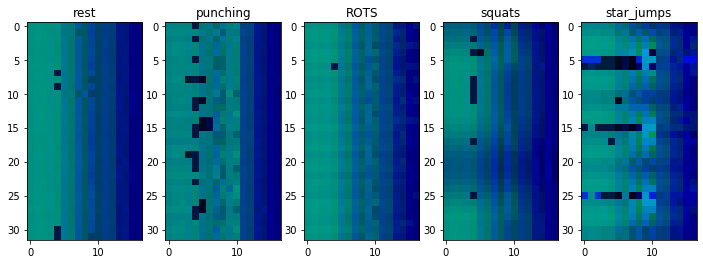

In [54]:
test_indices = [0, 350, 700, 1050, 1400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_train_flipped[test_indices[i]]
    test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action
    
    #test_image =clip_image(test_image)

    #print("min: ", test_image.min(), "max :", test_image.max())
    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_train[test_indices[i]]);

Augemented Train Data

((min, min), (max, max)): 
(( 0.0 ,  0.7256729974628662 ), ( 0.5989952171513169 ,  1.0 ))
((min, min), (max, max)): 
(( 0.0 ,  0.5915486900730749 ), ( 0.5596989341724062 ,  1.0 ))
((min, min), (max, max)): 
(( 0.0 ,  0.27223888086473946 ), ( 0.6091418566513711 ,  0.6413486579852627 ))
((min, min), (max, max)): 
(( 0.0 ,  0.3377561250499741 ), ( 0.4814842699296973 ,  0.7230517191091882 ))
((min, min), (max, max)): 
(( 0.0 ,  0.08602165804183448 ), ( 0.5272417373486222 ,  0.707286938590095 ))


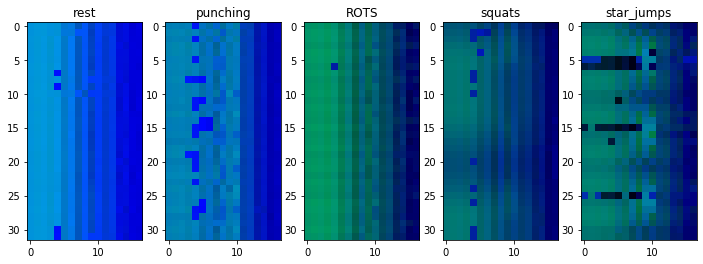

In [55]:
test_indices = [0, 350, 700, 1051, 1400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_train_augemented[test_indices[i]]
    test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action

    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_train_augemented[test_indices[i]]);

Test Data

((min, min), (max, max)): 
(( 0.0 ,  0.25980037288443125 ), ( 0.5835861983466242 ,  0.6161574714378625 ))
((min, min), (max, max)): 
(( 0.0 ,  0.11946626117721137 ), ( 0.5583878851818204 ,  0.860837291650735 ))
((min, min), (max, max)): 
(( 0.0 ,  0.11777399718065673 ), ( 0.6002284849664117 ,  0.6171555495911536 ))
((min, min), (max, max)): 
(( 0.0 ,  0.25025081530155374 ), ( 0.5760209662441149 ,  0.6304880737794513 ))
((min, min), (max, max)): 
(( 0.0 ,  0.09895695972071544 ), ( 0.6213254817265017 ,  0.8061883681479131 ))


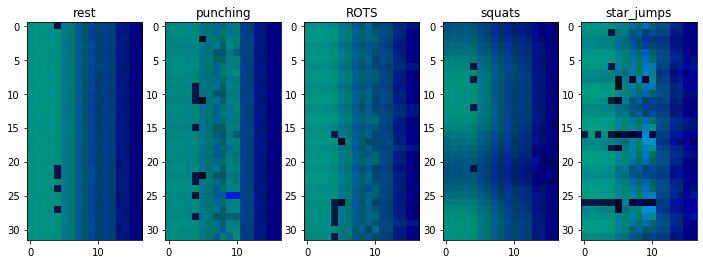

In [56]:
test_indices = [0, 100, 200, 300, 400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_test_flipped[test_indices[i]]
    test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action

    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_test[test_indices[i]]);

Look at the time average pose

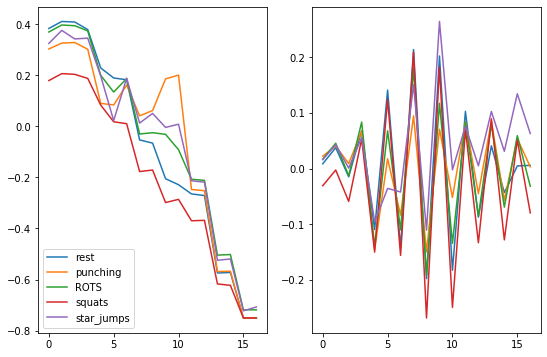

In [75]:
test_indices = [0, 100, 200, 300, 400]
fig, ax = plt.subplots(1,2)
fig.set_size_inches((9,6))
labels = []
for i in range(len(test_indices)):
    y = X_test_flipped[test_indices[i]].mean(axis=0)
    ax[0].plot(range(len(y)), y[:,0])
    ax[1].plot(range(len(y)), y[:,1])
    labels.append(y_test[test_indices[i]])
ax[0].legend(labels)

Squats and resting look the most similar in the time averaged pose

# flattened data structure

In [57]:
X_train_augemented = X_train_augemented.reshape(X_train_augemented.shape[0], -1)
X_test_not_augemented = X_test_flipped.reshape(X_test_flipped.shape[0], -1)
X_test_augemented = X_test_augemented.reshape(X_test_augemented.shape[0], -1)

In [58]:
model = LogisticRegression(multi_class='multinomial', solver='newton-cg')

In [59]:
model.fit(list(X_train_augemented), list(y_train_augemented))

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

In [60]:
print("train accuracy: ", model.score(X_train_augemented, y_train_augemented))
print("test accuracy: ", model.score(X_test_not_augemented, y_test))
print("augemented test accuracy: ", model.score(X_test_augemented, y_test_augemented))

train accuracy:  0.9996330275229358
test accuracy:  0.864367816091954
augemented test accuracy:  0.858735632183908


In [61]:
test_index = 32
print("True value: ", y_test[[test_index]][0])
print("Predicted value: ", model.predict(X_test_not_augemented[[test_index]])[0])

True value:  rest
Predicted value:  rest


In [62]:
conf_mat = confusion_matrix(y_test, model.predict(X_test_not_augemented))
conf_mat

array([[87,  0,  0,  0,  0],
       [ 0, 86,  0,  0,  1],
       [ 0,  0, 87,  0,  0],
       [ 0,  0, 58, 29,  0],
       [ 0,  0,  0,  0, 87]], dtype=int64)

In [63]:
import pickle
import marshal

In [64]:
models_path = 'models'
f_name = 'actionnet_flat_linear_preprocess_and_model_10_fps.pickle'
f_path = os.path.join(models_path,f_name)

code_string = marshal.dumps(preprocess_ndarray.__code__)
data = {
    "preprocess_function": code_string, 
    "model": model
}
with open(f_path, "wb") as f:
    pickle.dump(data, f)


# Investigate Model Weights

min: 0.163742415361356 max : 1.0
min:  0.3115022509717762 max : 0.8122195814125183
min:  0.0 max : 0.7301830113957208
min:  0.05891409185891579 max : 0.9086759779451136
min:  0.18000423508219165 max : 0.8230956122029232


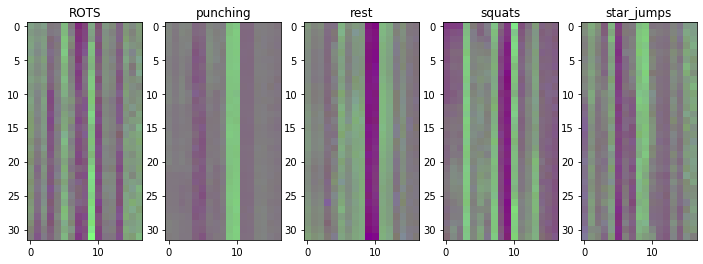

In [65]:
fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))

for i in range(len(model.coef_)):
    coefs = model.coef_[i].reshape((32,17,2))
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = coefs
    test_image = (test_image - model.coef_.min()) / (model.coef_.max() - model.coef_.min())
    #test_image =clip_image(test_image)

    print("min: ", test_image.min(), "max :", test_image.max())
    
    ax[i].imshow(test_image)
    ax[i].set_title(model.classes_[i]);
    